In [2]:
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import scipy.stats as st
import numpy as np
import scipy.stats as st
from sklearn import datasets
from datetime import datetime

In [3]:
#importing .csv file abd placed in a DataFrame
csv_file = Path ("original_data_toUse/owid-covid-data.csv")
covid_19_original_dataset_df = pd.read_csv(csv_file)
covid_19_original_dataset_df.head(10)

,iso_code,continent,location,date,total_cases,total_cases_per_capita,new_cases,new_cases_smoothed,total_deaths,total_deaths_per_capita,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-01-03,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-01-04,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-01-05,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-01-06,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-01-07,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
5,AFG,Asia,Afghanistan,2020-01-08,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
6,AFG,Asia,Afghanistan,2020-01-09,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
7,AFG,Asia,Afghanistan,2020-01-10,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
8,AFG,Asia,Afghanistan,2020-01-11,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
9,AFG,Asia,Afghanistan,2020-01-12,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN


In [4]:
# Checking data type for all columns
covid_19_original_dataset_df.dtypes

#Changing Date column type from object to date
covid_19_original_dataset_df["date"] = pd.to_datetime(covid_19_original_dataset_df["date"])
covid_19_original_dataset_df.dtypes
covid_19_original_dataset_df.head()

,iso_code,continent,location,date,total_cases,total_cases_per_capita,new_cases,new_cases_smoothed,total_deaths,total_deaths_per_capita,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-01-03,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-01-04,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-01-05,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-01-06,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-01-07,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN


In [5]:
# instead of dropping all NaN data, changing all Nan to zero to avoid losing any cases number data before vaccinations started
covid_19_original_dataset_analysis_df= covid_19_original_dataset_df[['iso_code', 'continent', 'location', 'date', 'total_cases', "total_cases_per_capita", 'new_cases', 'new_cases_smoothed', 'new_cases_per_million', 'new_cases_smoothed_per_million', 'new_cases_per_capita', 'total_deaths', 'total_deaths_per_capita', 'new_deaths', 'new_deaths_smoothed', 'icu_patients', 'icu_patients_per_capita', 'hosp_patients', 'hosp_patients_per_capita', 'total_vaccinations', 'total_vaccinations_per_capita', 'people_vaccinated', 'people_vaccinated_per_capita', 'people_fully_vaccinated', 'people_fully_vaccinated_per_capita', 'new_vaccinations', 'new_vaccinations_smoothed', 'new_vaccinations_smoothed_per_million', 'new_vaccinations_per_capita', 'population']].copy()
covid_19_original_dataset_analysis_df.fillna(0, inplace=True)
covid_19_original_dataset_analysis_df.head()


# ignoring any line where continent column reads zero. when checking data, any cell that reads zero in continent 
# does not correspond to a country under location
# Analysis carried only until end of 2022
covid_19_original_dataset_analysis_df = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["continent"] != 0)]
covid_19_original_dataset_analysis_df = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["date"] < "2023-01-01")]
number_of_rows = len(covid_19_original_dataset_analysis_df)
#print(number_of_rows)

# Upon ploting data for all countries in the following steps, some countires showed un-realistic curve trends, some did not include
# cases before vaccinations roll-out, some did not show any date after vaccinations roll out. Prefered to ignore them here, as this
# dataframe will be used for further analysis
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'American Samoa'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Cook Islands'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'England'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Eritrea'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'French Guiana'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Guadeloupe'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Guam'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Hong Kong'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Kiribati'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Kyrgyzstan'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Macao'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Marshall Islands'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Martinique'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Mayotte'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Micronesia (country)'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Nauru'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Niue'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'North Korea'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Northern Cyprus'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Northern Ireland'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Northern Mariana Islands'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Palau'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Pitcairn'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Puerto Rico'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Reunion'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Saint Barthelemy'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Saint Helena'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Saint Martin (French part)'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Saint Pierre and Miquelon'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Scotland'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Taiwan'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Tokelau'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Tonga'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Turkmenistan'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Tuvalu'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'United States Virgin Islands'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Vatican'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Wales'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Western Sahara'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Bonaire Sint Eustatius and Saba'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Chad'].index, inplace = True)
covid_19_original_dataset_analysis_df.drop(covid_19_original_dataset_analysis_df[covid_19_original_dataset_analysis_df["location"] == 'Chaina'].index, inplace = True)

# Creating a list to summarise all counties and population in the DataFrame
country_list = []
population_list = []
country_list = covid_19_original_dataset_analysis_df['location'].unique()
population_list = covid_19_original_dataset_analysis_df['population'].unique()
#print (country_list)
number_of_countries = len(country_list)
print(number_of_countries)
number_of_populations = len(population_list)
print(number_of_populations)

#calculating ratio of population vaccinated to be used later, if analysis required
ratio_vaccinated = []
for i in range (0, number_of_countries):
    country = country_list[i]
    population = population_list[i]
    max_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country)]["people_fully_vaccinated"].max() 
    ratio = max_vacc / population
    ratio_vaccinated.append(ratio)


#Creating a list to summarise start date of vacc for each country
vacc_start_date_list = []
covid_19_original_dataset_analysis_date_df = pd.DataFrame()
for i in range (0, number_of_countries):
    country = country_list[i]
    covid_19_original_dataset_analysis_date_df = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country)] 
    covid_19_original_dataset_analysis_date_df.reset_index(inplace=True)
    for index, row in covid_19_original_dataset_analysis_date_df.iterrows():
        if row["new_vaccinations_smoothed_per_million"] == 0:
            pass
        else:
            date =  row["date"]
            #print(date)
            vacc_start_date_list.append(date)
            break
#print(vacc_start_date_list)
number_of_dates = len(vacc_start_date_list)
print(number_of_dates)


Country_start_date_of_vacc_df = pd.DataFrame({"Country":country_list,
                 "First Date of Vacc":vacc_start_date_list,
                 "Population":population_list,
                 "Ratio Vaccinated":ratio_vaccinated})

Country_start_date_of_vacc_df.sort_values(by='First Date of Vacc', inplace=True)

Country_start_date_of_vacc_df.reset_index(inplace=True)

print(Country_start_date_of_vacc_df.head(20))
print("\n--------------------------------------------------------------\n")
print(Country_start_date_of_vacc_df.tail(20))
print("\n--------------------------------------------------------------\n")

#creating lists to hold top 20 countries and bottom 20 countries (based of data of Vaccination roll-out)
top_countries = []
top_dates = []
for i in range (0, 20):
    country_top = Country_start_date_of_vacc_df.iloc[i]["Country"]
    date_top  = Country_start_date_of_vacc_df.iloc[i]["First Date of Vacc"]
    top_countries.append(country_top)
    top_dates.append(date_top)
print(top_countries)
print("\n--------------------------------------------------------------\n")
print(top_dates)
print("\n--------------------------------------------------------------\n")

bottom_countries = []
bottom_dates = []
for i in range (182, 202):
    country_bottom = Country_start_date_of_vacc_df.iloc[i]["Country"]
    date_bottom  = Country_start_date_of_vacc_df.iloc[i]["First Date of Vacc"]
    bottom_countries.append(country_bottom)
    bottom_dates.append(date_bottom)
print(bottom_countries)
print("\n--------------------------------------------------------------\n")
print(bottom_dates)




202
202
202
    index         Country First Date of Vacc  Population  Ratio Vaccinated
0     192   United States         2020-12-14   338289856          0.678651
1      34          Canada         2020-12-15    38454328          0.825163
2     150          Russia         2020-12-16   144713312          0.545422
3      39           China         2020-12-16  1425887360          0.893491
4     137          Norway         2020-12-17     5434324          0.746133
5     103          Latvia         2020-12-18     1850654          0.705684
6      92          Israel         2020-12-20     9449000          0.651758
7     148           Qatar         2020-12-23     2695131          1.057521
8     177     Switzerland         2020-12-23     8740471          0.000000
9      14         Bahrain         2020-12-24     1472237          0.833287
10     38           Chile         2020-12-25    19603736          0.902674
11    119          Mexico         2020-12-25   127504120          0.641940
12     43    

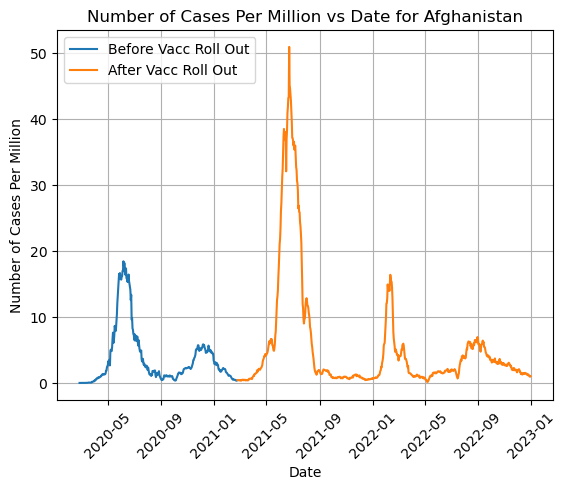

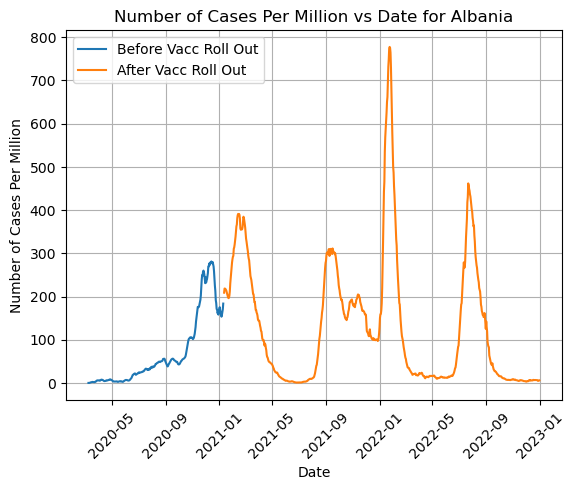

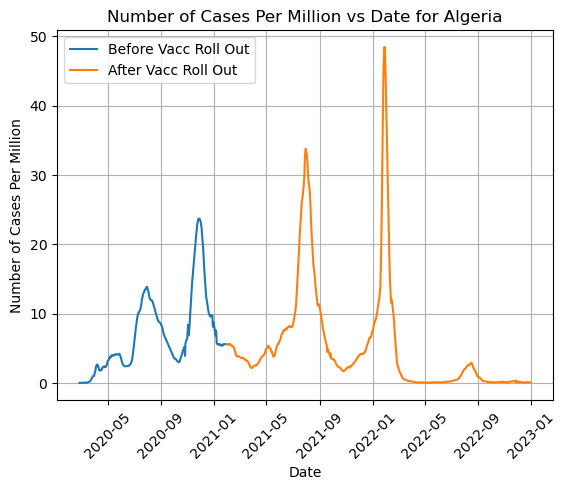

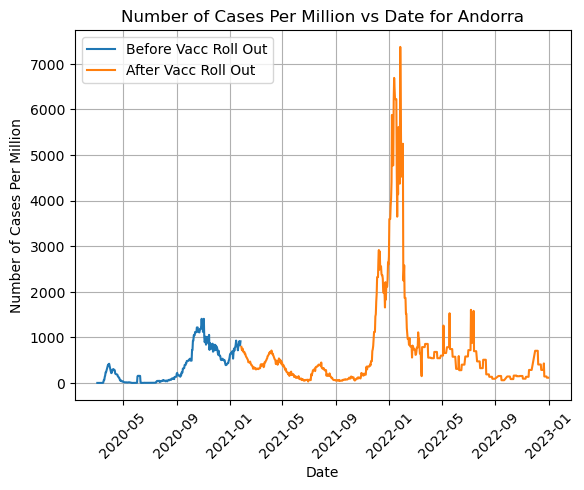

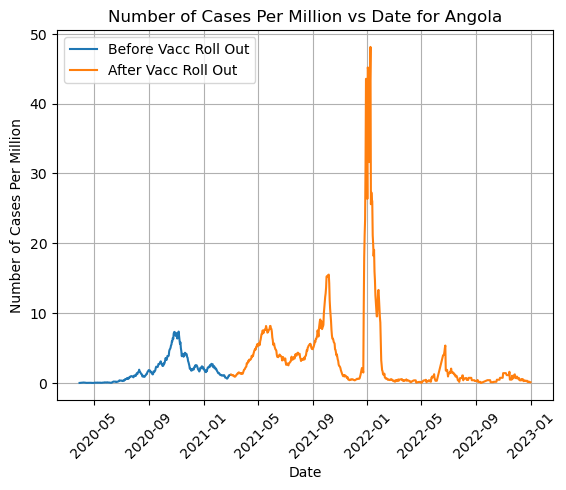

...

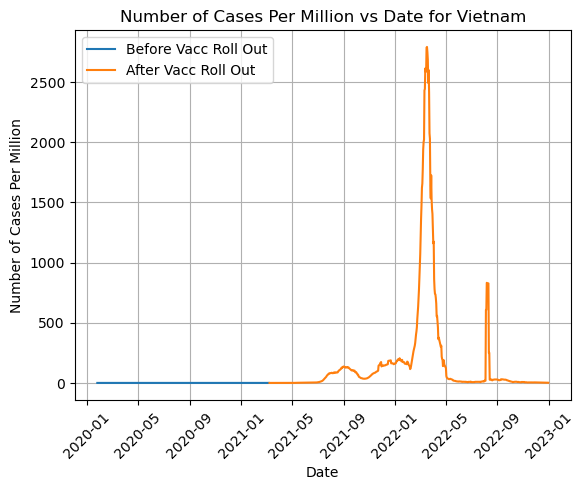

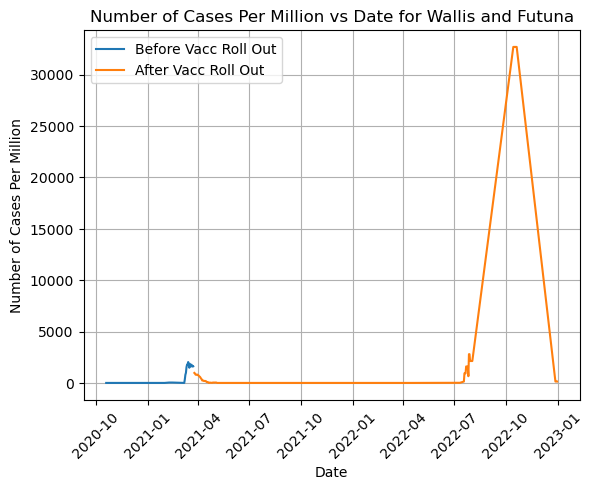

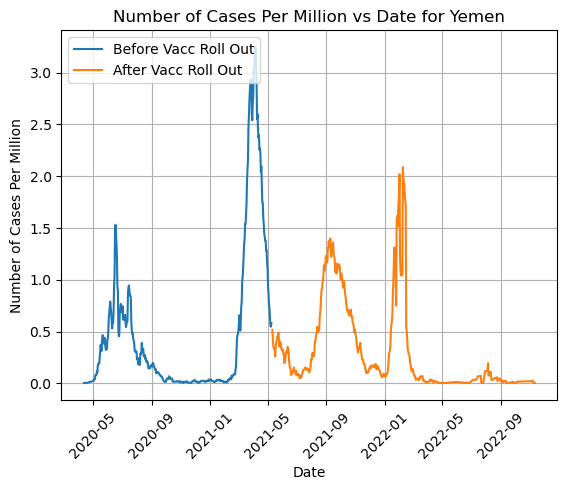

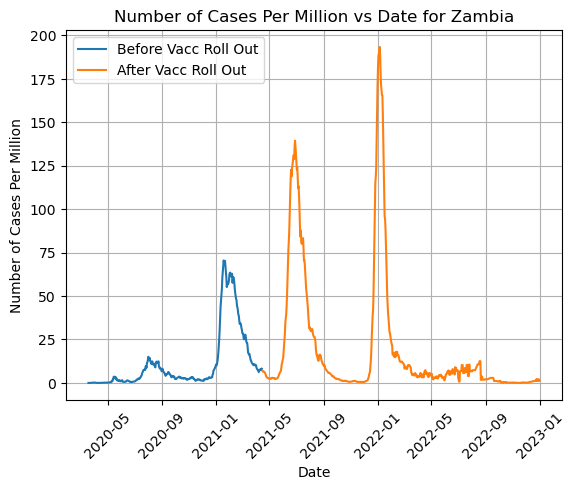

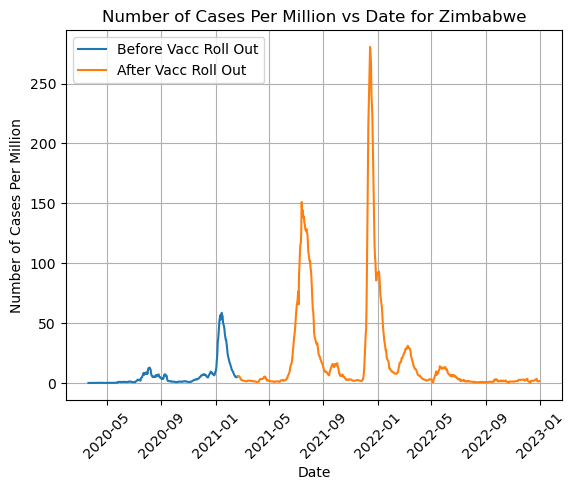

In [5]:
#Number of cases Vs Date (combined Before and after Vaccinations)

for i in range (0, number_of_countries):
    country = country_list[i]
    date = vacc_start_date_list[i]
    covid_19_original_dataset_analysis_for_plots_df = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] < date)]
    covid_19_original_dataset_analysis_for_plots_1_df = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] > date)]
    x1_axis = covid_19_original_dataset_analysis_for_plots_df["date"]
    x2_axis = covid_19_original_dataset_analysis_for_plots_1_df["date"]
    y1_axis = covid_19_original_dataset_analysis_for_plots_df.loc[(covid_19_original_dataset_analysis_for_plots_df["location"] == country) & (covid_19_original_dataset_analysis_for_plots_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_for_plots_df["date"] < date)]["new_cases_smoothed_per_million"]
    y2_axis = covid_19_original_dataset_analysis_for_plots_1_df.loc[(covid_19_original_dataset_analysis_for_plots_1_df["location"] == country) & (covid_19_original_dataset_analysis_for_plots_1_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_for_plots_1_df["date"] > date)]["new_cases_smoothed_per_million"]
    #start_date = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["new_cases_smoothed"] > 0) & (covid_19_original_dataset_analysis_df["new_vaccinations_smoothed"] == 0)]["date"].min()
    #end_date = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["new_cases_smoothed"] > 0) & (covid_19_original_dataset_analysis_df["new_vaccinations_smoothed"] > 0)]["date"].max()
    
    #covid_19_original_dataset_analysis_for_plots_df.plot(x="date", y="new_cases_smoothed", rot=45)
    #covid_19_original_dataset_analysis_for_plots_1_df.plot(x="date", y="new_cases_smoothed", rot=45)
    #plt.figure(figsize=(20,10))
    plt.plot(x1_axis, y1_axis)
    plt.plot(x2_axis, y2_axis)
    #plt.xticks([])
    plt.xticks(rotation=45)
    plt.title("Number of Cases Per Million vs Date for {country}".format (country=country))
    plt.xlabel("Date")
    plt.ylabel("Number of Cases Per Million")
    plt.legend(["Before Vacc Roll Out", "After Vacc Roll Out"], loc ="upper left")
    #plt.legend({country})
    plt.grid(True)
    plt.show()
    i = i +1

           Country Vacc Ratio  Total Cases Before Vacc  \
0    United States      0.679                45378.895   
1           Canada      0.825                11332.360   
5           Latvia      0.706                13200.066   
10           Chile      0.903                29851.143   
11          Mexico      0.642                10938.561   
12      Costa Rica      0.828                30540.274   
13         Denmark      0.805                23362.774   
14  Cayman Islands      0.881                 4583.696   
15       Lithuania      0.684                46074.190   
16         Czechia      0.657                62640.859   
17        Slovenia      0.577                50760.046   
18          France      0.784                35068.415   
19         Germany      0.762                18485.911   

    Total Cases After Vacc  Max for Cases Before Vacc  \
0               247033.406                    620.128   
1               104966.108                    171.896   
5               

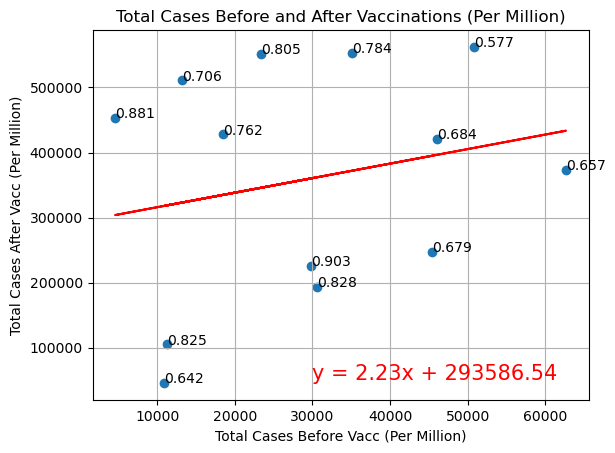

R-squred = 0.0507


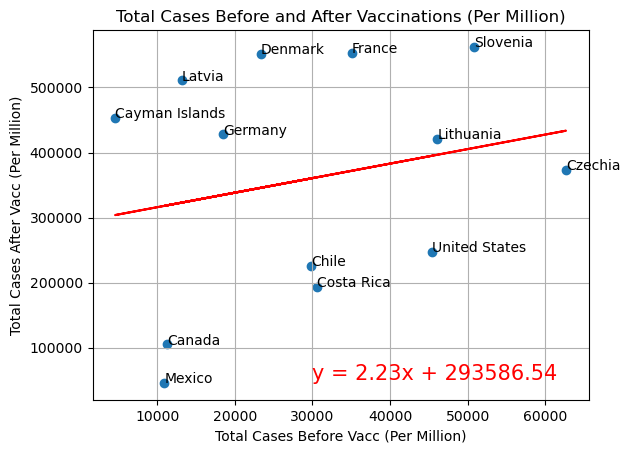

R-squred = 0.1736


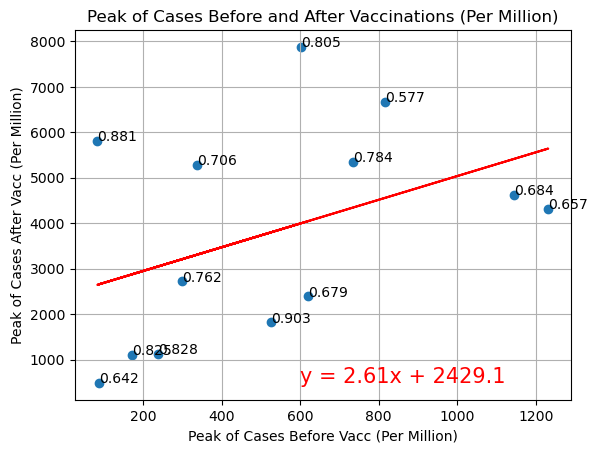

R-squred = 0.1736


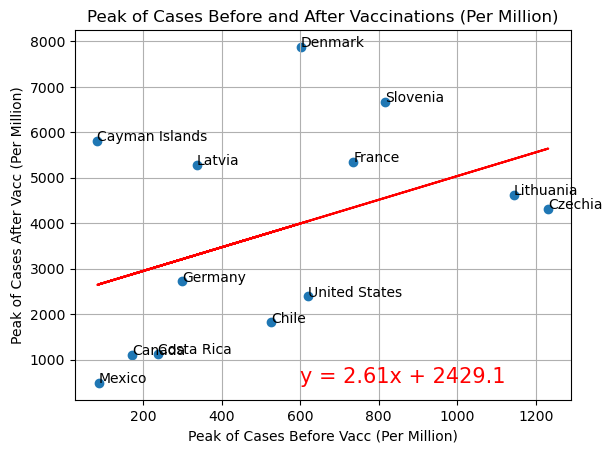

R-squred = 0.0598


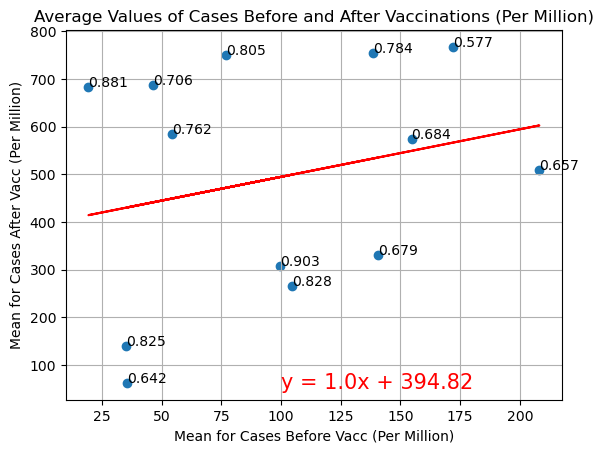

R-squred = 0.0598


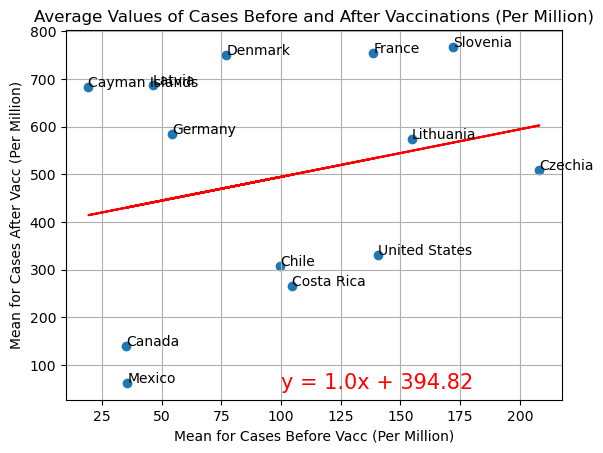

In [7]:
#Statstical Study - Top 20 Countries
# generating parameters
top_list_sum_cases_before_vacc = []
top_list_max_cases_before_vacc = []
top_list_min_cases_before_vacc = []
top_list_mean_cases_before_vacc = []
top_list_median_cases_before_vacc = []
top_list_std_dev_cases_before_vacc = []
top_list_sum_cases_after_vacc = []
top_list_max_cases_after_vacc = []
top_list_min_cases_after_vacc = []
top_list_mean_cases_after_vacc = []
top_list_median_cases_after_vacc = []
top_list_std_dev_cases_after_vacc = []
top_list_max_vacc = []
top_list_min_vacc = []
top_list_mean_vacc = []
top_list_median_vacc = []
top_list_std_dev_vacc = []
top_list_vacc_ratio = []

for i in range (0, 20):
    country = top_countries [i]
    date = top_dates [i] 
    sum_cases_before_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] < date)]["new_cases_smoothed_per_million"].sum()
    top_list_sum_cases_before_vacc.append(sum_cases_before_vacc)
    max_cases_before_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] < date)]["new_cases_smoothed_per_million"].max()
    top_list_max_cases_before_vacc.append(max_cases_before_vacc)
    min_cases_before_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] < date)]["new_cases_smoothed_per_million"].min()
    top_list_min_cases_before_vacc.append(min_cases_before_vacc)
    mean_cases_before_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] < date)]["new_cases_smoothed_per_million"].mean()
    top_list_mean_cases_before_vacc.append(mean_cases_before_vacc)
    median_cases_before_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] < date)]["new_cases_smoothed_per_million"].median()
    top_list_median_cases_before_vacc.append(median_cases_before_vacc)
    std_dev_cases_before_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] < date)]["new_cases_smoothed_per_million"].std()
    top_list_std_dev_cases_before_vacc.append(std_dev_cases_before_vacc)
    sum_cases_after_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] > date)]["new_cases_smoothed_per_million"].sum()
    top_list_sum_cases_after_vacc.append(sum_cases_after_vacc)
    max_cases_after_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] > date)]["new_cases_smoothed_per_million"].max()
    top_list_max_cases_after_vacc.append(max_cases_after_vacc)
    min_cases_after_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] > date)]["new_cases_smoothed_per_million"].min()
    top_list_min_cases_after_vacc.append(min_cases_after_vacc)
    mean_cases_after_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] > date)]["new_cases_smoothed_per_million"].mean()
    top_list_mean_cases_after_vacc.append(mean_cases_after_vacc)
    median_cases_after_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] > date)]["new_cases_smoothed_per_million"].median()
    top_list_median_cases_after_vacc.append(median_cases_after_vacc)
    std_dev_cases_after_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] > date)]["new_cases_smoothed_per_million"].std()
    top_list_std_dev_cases_after_vacc.append(std_dev_cases_after_vacc)
    max_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_vaccinations_smoothed_per_million"] > 0)]["new_vaccinations_smoothed_per_million"].max()
    top_list_max_vacc.append(max_vacc)
    min_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_vaccinations_smoothed_per_million"] > 0)]["new_vaccinations_smoothed_per_million"].min() 
    top_list_min_vacc.append(min_vacc)
    mean_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_vaccinations_smoothed_per_million"] > 0)]["new_vaccinations_smoothed_per_million"].mean()
    top_list_mean_vacc.append(mean_vacc)
    median_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_vaccinations_smoothed_per_million"] > 0)]["new_vaccinations_smoothed_per_million"].median()
    top_list_median_vacc.append(median_vacc)
    std_dev_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_vaccinations_smoothed_per_million"] > 0)]["new_vaccinations_smoothed_per_million"].std()
    top_list_std_dev_vacc.append(std_dev_vacc)   

# collecting Ratio of people vaccinated for the top 20 countries (0 to 20) calculated earlier using Country_start_date_of_vacc_df in which date
# is sorted (earlier to later)
for i in range (0, 20):
    vacc_ratio = Country_start_date_of_vacc_df.iloc[i]["Ratio Vaccinated"]
    vacc_ratio = "%.3f" % vacc_ratio
    top_list_vacc_ratio. append(vacc_ratio)
    

statistics_df = pd.DataFrame({'Country':top_countries,
                 "Vacc Ratio": top_list_vacc_ratio,
                 "Total Cases Before Vacc": top_list_sum_cases_before_vacc,
                 "Total Cases After Vacc" : top_list_sum_cases_after_vacc,            
                 "Max for Cases Before Vacc":top_list_max_cases_before_vacc,
                 'Max for Cases After Vacc': top_list_max_cases_after_vacc,
                 'Min for Cases Before Vacc': top_list_min_cases_before_vacc,
                 'Min for Cases After Vacc': top_list_min_cases_after_vacc,
                 'Mean for Cases Before Vacc':top_list_mean_cases_before_vacc,
                 'Mean for Cases After Vacc': top_list_mean_cases_after_vacc,
                 'Median for Cases Before Vacc':top_list_median_cases_before_vacc,
                 'Median for Cases After Vacc': top_list_median_cases_after_vacc,
                 'Std Dev for Cases Before Vacc': top_list_std_dev_cases_before_vacc,
                 'Std Dev for Cases After Vacc': top_list_std_dev_cases_after_vacc,
                 'Max Vacc': top_list_max_vacc,
                 'Min Vacc': top_list_min_vacc,
                 'Mean Vacc': top_list_mean_vacc,
                 'Median Vacc': top_list_median_vacc,
                 'Std Dev Vacc': top_list_std_dev_vacc})
                
statistics_df.drop(statistics_df[statistics_df["Country"] == 'China'].index, inplace = True)
statistics_df.drop(statistics_df[statistics_df["Country"] == 'Qatar'].index, inplace = True)
statistics_df.drop(statistics_df[statistics_df["Country"] == 'Norway'].index, inplace = True)
statistics_df.drop(statistics_df[statistics_df["Country"] == 'Switzerland'].index, inplace = True)
statistics_df.drop(statistics_df[statistics_df["Country"] == 'Russia'].index, inplace = True)
statistics_df.drop(statistics_df[statistics_df["Country"] == 'Israel'].index, inplace = True)
statistics_df.drop(statistics_df[statistics_df["Country"] == 'Bahrain'].index, inplace = True)

print(statistics_df)                

#Defining ranges in which main cloud of data appear
statistics_df = statistics_df.dropna()
#statistics_df = statistics_df.loc[(statistics_df["Max for Cases Before Vacc"] > 0) & (statistics_df["Max for Cases Before Vacc"] <2000) & (statistics_df["Max for Cases After Vacc"] > 0) & (statistics_df["Max for Cases After Vacc"] <5000)]
#statistics_df = statistics_df.loc[(statistics_df["Mean for Cases Before Vacc"] > 0) & (statistics_df["Mean for Cases Before Vacc"] <250) & (statistics_df["Mean for Cases After Vacc"] > 0) & (statistics_df["Mean for Cases After Vacc"] <750)]
#statistics_df = statistics_df.loc[(statistics_df["Median for Cases Before Vacc"] > 0) & (statistics_df["Median for Cases Before Vacc"] <200) & (statistics_df["Median for Cases After Vacc"] > 0) & (statistics_df["Median for Cases After Vacc"] <400)]
#statistics_df = statistics_df.loc[(statistics_df["Max Vacc"] > 0) & (statistics_df["Max Vacc"] <20000)]


# Creating plots
x_values = statistics_df["Total Cases Before Vacc"]
y_values = statistics_df["Total Cases After Vacc"]
plt.title("Total Cases Before and After Vaccinations (Per Million)")
plt.xlabel("Total Cases Before Vacc (Per Million)")
plt.ylabel("Total Cases After Vacc (Per Million)")
plt.grid(True)
(slope, intercept, rvalue, pvalue, stderr) = st.linregress(x_values, y_values)
regress_values = x_values * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))
plt.scatter(x_values, y_values)
plt.plot(x_values,regress_values,"r-")
plt.annotate(line_eq,(30000, 50000),fontsize=15,color="red")
print(f"R-squred = {round(rvalue**2, 4)}")
for index, row in statistics_df.iterrows():
    plt.annotate(row['Vacc Ratio'], (row['Total Cases Before Vacc'], row ['Total Cases After Vacc']))
plt.show()

x_values = statistics_df["Total Cases Before Vacc"]
y_values = statistics_df["Total Cases After Vacc"]
plt.title("Total Cases Before and After Vaccinations (Per Million)")
plt.xlabel("Total Cases Before Vacc (Per Million)")
plt.ylabel("Total Cases After Vacc (Per Million)")
plt.grid(True)
(slope, intercept, rvalue, pvalue, stderr) = st.linregress(x_values, y_values)
regress_values = x_values * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))
plt.scatter(x_values, y_values)
plt.plot(x_values,regress_values,"r-")
plt.annotate(line_eq,(30000, 50000),fontsize=15,color="red")
print(f"R-squred = {round(rvalue**2, 4)}")
for index, row in statistics_df.iterrows():
    plt.annotate(row['Country'], (row['Total Cases Before Vacc'], row ['Total Cases After Vacc']))
plt.show()

x_values = statistics_df["Max for Cases Before Vacc"]
y_values = statistics_df["Max for Cases After Vacc"]
plt.title("Peak of Cases Before and After Vaccinations (Per Million)")
plt.xlabel("Peak of Cases Before Vacc (Per Million)")
plt.ylabel("Peak of Cases After Vacc (Per Million)")
plt.grid(True)
(slope, intercept, rvalue, pvalue, stderr) = st.linregress(x_values, y_values)
regress_values = x_values * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))
plt.scatter(x_values, y_values)
plt.plot(x_values,regress_values,"r-")
plt.annotate(line_eq,(600, 500),fontsize=15,color="red")
print(f"R-squred = {round(rvalue**2, 4)}")
for index, row in statistics_df.iterrows():
    plt.annotate(row['Vacc Ratio'], (row['Max for Cases Before Vacc'], row ['Max for Cases After Vacc']))
plt.show()

x_values = statistics_df["Max for Cases Before Vacc"]
y_values = statistics_df["Max for Cases After Vacc"]
plt.title("Peak of Cases Before and After Vaccinations (Per Million)")
plt.xlabel("Peak of Cases Before Vacc (Per Million)")
plt.ylabel("Peak of Cases After Vacc (Per Million)")
plt.grid(True)
(slope, intercept, rvalue, pvalue, stderr) = st.linregress(x_values, y_values)
regress_values = x_values * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))
plt.scatter(x_values, y_values)
plt.plot(x_values,regress_values,"r-")
plt.annotate(line_eq,(600, 500),fontsize=15,color="red")
print(f"R-squred = {round(rvalue**2, 4)}")
for index, row in statistics_df.iterrows():
    plt.annotate(row['Country'], (row['Max for Cases Before Vacc'], row ['Max for Cases After Vacc']))
plt.show()

x_values = statistics_df["Mean for Cases Before Vacc"]
y_values = statistics_df["Mean for Cases After Vacc"]
plt.title("Average Values of Cases Before and After Vaccinations (Per Million)")
plt.xlabel("Mean for Cases Before Vacc (Per Million)")
plt.ylabel("Mean for Cases After Vacc (Per Million)")
plt.grid(True)
(slope, intercept, rvalue, pvalue, stderr) = st.linregress(x_values, y_values)
regress_values = x_values * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))
plt.scatter(x_values, y_values)
plt.plot(x_values,regress_values,"r-")
plt.annotate(line_eq,(100, 50),fontsize=15,color="red")
print(f"R-squred = {round(rvalue**2, 4)}")
for index, row in statistics_df.iterrows():
    plt.annotate(row['Vacc Ratio'], (row['Mean for Cases Before Vacc'], row ['Mean for Cases After Vacc']))
plt.show()

x_values = statistics_df["Mean for Cases Before Vacc"]
y_values = statistics_df["Mean for Cases After Vacc"]
plt.title("Average Values of Cases Before and After Vaccinations (Per Million)")
plt.xlabel("Mean for Cases Before Vacc (Per Million)")
plt.ylabel("Mean for Cases After Vacc (Per Million)")
plt.grid(True)
(slope, intercept, rvalue, pvalue, stderr) = st.linregress(x_values, y_values)
regress_values = x_values * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))
plt.scatter(x_values, y_values)
plt.plot(x_values,regress_values,"r-")
plt.annotate(line_eq,(100, 50),fontsize=15,color="red")
print(f"R-squred = {round(rvalue**2, 4)}")
for index, row in statistics_df.iterrows():
    plt.annotate(row['Country'], (row['Mean for Cases Before Vacc'], row ['Mean for Cases After Vacc']))
plt.show()

                         Country Vacc Ratio  Total Cases Before Vacc  \
0                        Somalia      0.359                  716.984   
1                          Libya      0.181                24842.033   
2   Democratic Republic of Congo      0.069                  290.667   
3                        Comoros      0.475                 4559.464   
4                          Samoa      0.799                    4.494   
5      Sint Maarten (Dutch part)      0.603                50603.864   
6                     Tajikistan      0.520                 1377.909   
7                          Yemen      0.022                  190.213   
8                  Guinea-Bissau      0.172                 1776.220   
9                        Liberia      0.704                  401.580   
10      Central African Republic      0.347                 1862.007   
11                    Madagascar      0.068                 1316.498   
12                         Benin      0.205                  593

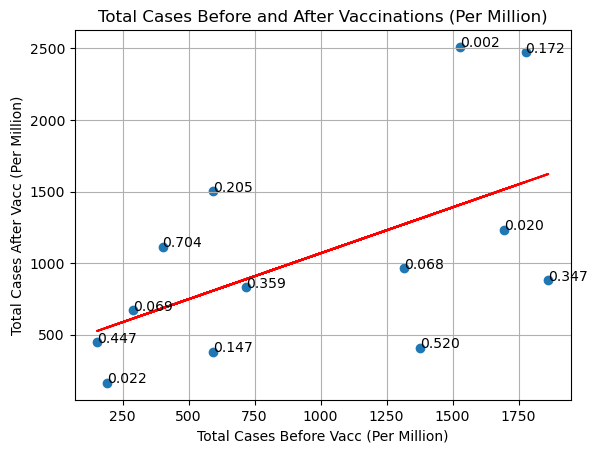

R-squred = 0.3085


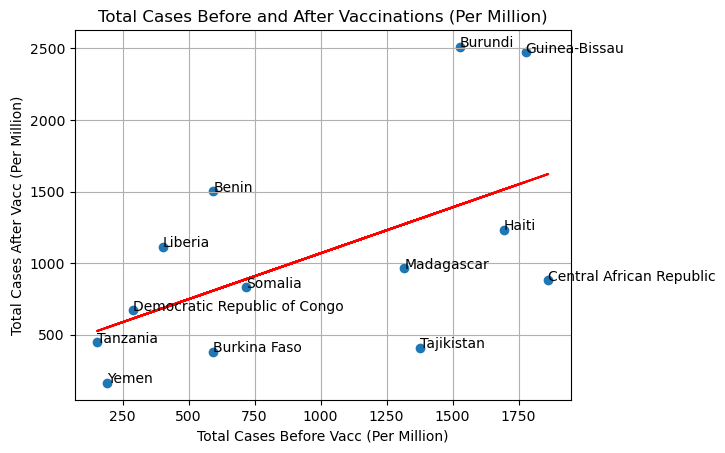

R-squred = 0.0806


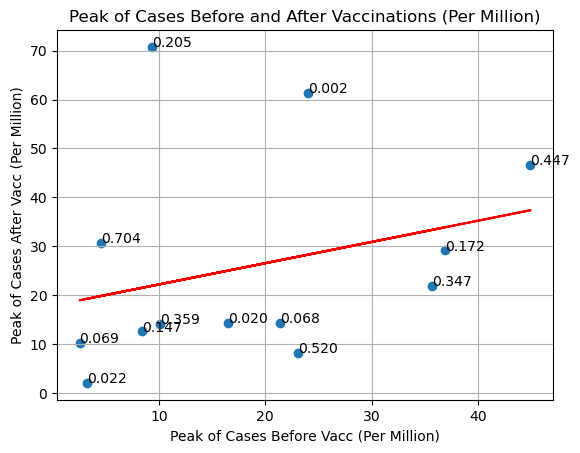

R-squred = 0.0806


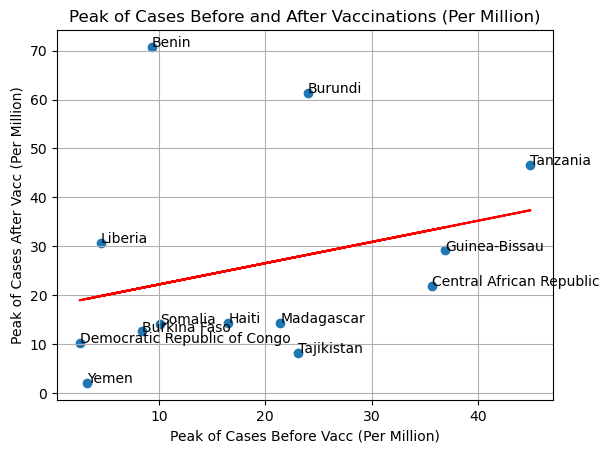

R-squred = 0.2187


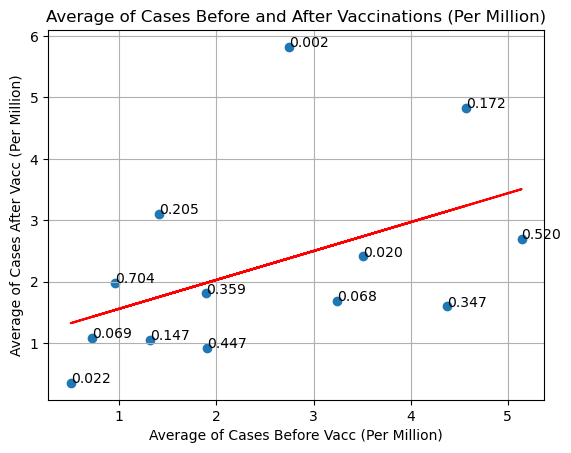

R-squred = 0.2187


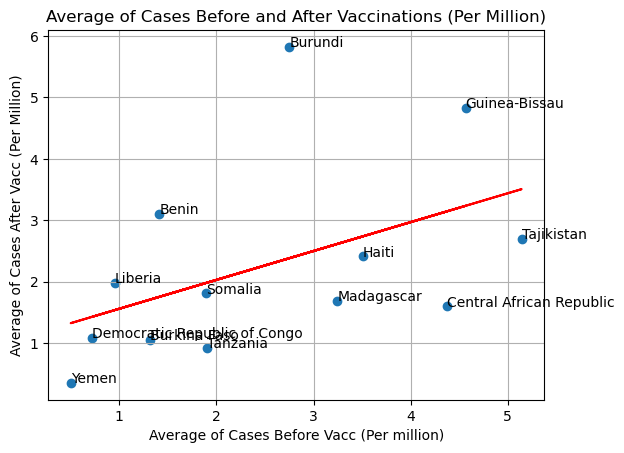

In [8]:
#Statstical Study - Bottom 20 Countries
# generating parameters
bottom_list_sum_cases_before_vacc = []
bottom_list_max_cases_before_vacc = []
bottom_list_min_cases_before_vacc = []
bottom_list_mean_cases_before_vacc = []
bottom_list_median_cases_before_vacc = []
bottom_list_std_dev_cases_before_vacc = []
bottom_list_sum_cases_after_vacc = []
bottom_list_max_cases_after_vacc = []
bottom_list_min_cases_after_vacc = []
bottom_list_mean_cases_after_vacc = []
bottom_list_median_cases_after_vacc = []
bottom_list_std_dev_cases_after_vacc = []
bottom_list_max_vacc = []
bottom_list_min_vacc = []
bottom_list_mean_vacc = []
bottom_list_median_vacc = []
bottom_list_std_dev_vacc = []
bottom_list_vacc_ratio = []
bottom_list_vacc_ratio = []

for i in range (0, 20):
    country = bottom_countries [i]
    date = bottom_dates [i] 
    sum_cases_before_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] < date)]["new_cases_smoothed_per_million"].sum()
    bottom_list_sum_cases_before_vacc.append(sum_cases_before_vacc)
    max_cases_before_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] < date)]["new_cases_smoothed_per_million"].max()
    bottom_list_max_cases_before_vacc.append(max_cases_before_vacc)
    min_cases_before_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] < date)]["new_cases_smoothed_per_million"].min()
    bottom_list_min_cases_before_vacc.append(min_cases_before_vacc)
    mean_cases_before_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] < date)]["new_cases_smoothed_per_million"].mean()
    bottom_list_mean_cases_before_vacc.append(mean_cases_before_vacc)
    median_cases_before_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] < date)]["new_cases_smoothed_per_million"].median()
    bottom_list_median_cases_before_vacc.append(median_cases_before_vacc)
    std_dev_cases_before_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] < date)]["new_cases_smoothed_per_million"].std()
    bottom_list_std_dev_cases_before_vacc.append(std_dev_cases_before_vacc)
    sum_cases_after_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] > date)]["new_cases_smoothed_per_million"].sum()
    bottom_list_sum_cases_after_vacc.append(sum_cases_after_vacc)
    max_cases_after_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] > date)]["new_cases_smoothed_per_million"].max()
    bottom_list_max_cases_after_vacc.append(max_cases_after_vacc)
    min_cases_after_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] > date)]["new_cases_smoothed_per_million"].min()
    bottom_list_min_cases_after_vacc.append(min_cases_after_vacc)
    mean_cases_after_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] > date)]["new_cases_smoothed_per_million"].mean()
    bottom_list_mean_cases_after_vacc.append(mean_cases_after_vacc)
    median_cases_after_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] > date)]["new_cases_smoothed_per_million"].median()
    bottom_list_median_cases_after_vacc.append(median_cases_after_vacc)
    std_dev_cases_after_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_cases_smoothed_per_million"] > 0) & (covid_19_original_dataset_analysis_df["date"] > date)]["new_cases_smoothed_per_million"].std()
    bottom_list_std_dev_cases_after_vacc.append(std_dev_cases_after_vacc)
    max_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_vaccinations_smoothed_per_million"] > 0)]["new_vaccinations_smoothed_per_million"].max()
    bottom_list_max_vacc.append(max_vacc)
    min_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_vaccinations_smoothed_per_million"] > 0)]["new_vaccinations_smoothed_per_million"].min() 
    bottom_list_min_vacc.append(min_vacc)
    mean_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_vaccinations_smoothed_per_million"] > 0)]["new_vaccinations_smoothed_per_million"].mean()
    bottom_list_mean_vacc.append(mean_vacc)
    median_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_vaccinations_smoothed_per_million"] > 0)]["new_vaccinations_smoothed_per_million"].median()
    bottom_list_median_vacc.append(median_vacc)
    std_dev_vacc = covid_19_original_dataset_analysis_df.loc[(covid_19_original_dataset_analysis_df["location"] == country) & (covid_19_original_dataset_analysis_df["new_vaccinations_smoothed_per_million"] > 0)]["new_vaccinations_smoothed_per_million"].std()
    bottom_list_std_dev_vacc.append(std_dev_vacc)

# collecting Ratio of people vaccinated for the bottom 20 countries (182 to 202) calculated earlier using Country_start_date_of_vacc_df in which date
# is sorted (earlier to later)
for i in range (182, 202):
    vacc_ratio = Country_start_date_of_vacc_df.iloc[i]["Ratio Vaccinated"]
    vacc_ratio = "%.3f" % vacc_ratio
    bottom_list_vacc_ratio. append(vacc_ratio)

statistics_df = pd.DataFrame({'Country':bottom_countries,
                 "Vacc Ratio": bottom_list_vacc_ratio,
                 "Total Cases Before Vacc": bottom_list_sum_cases_before_vacc,
                 "Total Cases After Vacc" : bottom_list_sum_cases_after_vacc,            
                 "Max for Cases Before Vacc":bottom_list_max_cases_before_vacc,
                 'Max for Cases After Vacc': bottom_list_max_cases_after_vacc,
                 'Min for Cases Before Vacc': bottom_list_min_cases_before_vacc,
                 'Min for Cases After Vacc': bottom_list_min_cases_after_vacc,
                 'Mean for Cases Before Vacc':bottom_list_mean_cases_before_vacc,
                 'Mean for Cases After Vacc': bottom_list_mean_cases_after_vacc,
                 'Median for Cases Before Vacc':bottom_list_median_cases_before_vacc,
                 'Median for Cases After Vacc': bottom_list_median_cases_after_vacc,
                 'Std Dev for Cases Before Vacc': bottom_list_std_dev_cases_before_vacc,
                 'Std Dev for Cases After Vacc': bottom_list_std_dev_cases_after_vacc,
                 'Max Vacc': bottom_list_max_vacc,
                 'Min Vacc': bottom_list_min_vacc,
                 'Mean Vacc': bottom_list_mean_vacc,
                 'Median Vacc': bottom_list_median_vacc,
                 'Std Dev Vacc': bottom_list_std_dev_vacc})
                
print(statistics_df)

statistics_df.drop(statistics_df[statistics_df["Country"] == 'Sint Maarten (Dutch part)'].index, inplace = True)
statistics_df.drop(statistics_df[statistics_df["Country"] == 'British Virgin Islands'].index, inplace = True)
statistics_df.drop(statistics_df[statistics_df["Country"] == 'Cuba'].index, inplace = True)
statistics_df.drop(statistics_df[statistics_df["Country"] == 'Samoa'].index, inplace = True)
statistics_df.drop(statistics_df[statistics_df["Country"] == 'Libya'].index, inplace = True)                
statistics_df.drop(statistics_df[statistics_df["Country"] == 'Vanuatu'].index, inplace = True)
statistics_df.drop(statistics_df[statistics_df["Country"] == 'Comoros'].index, inplace = True)

                
#Defining ranges in which main cloud of data appear
statistics_df = statistics_df.dropna()
#statistics_df = statistics_df.loc[(statistics_df["Max for Cases Before Vacc"] > 0) & (statistics_df["Max for Cases Before Vacc"] <2000) & (statistics_df["Max for Cases After Vacc"] > 0) & (statistics_df["Max for Cases After Vacc"] <5000)]
#statistics_df = statistics_df.loc[(statistics_df["Mean for Cases Before Vacc"] > 0) & (statistics_df["Mean for Cases Before Vacc"] <250) & (statistics_df["Mean for Cases After Vacc"] > 0) & (statistics_df["Mean for Cases After Vacc"] <750)]
#statistics_df = statistics_df.loc[(statistics_df["Median for Cases Before Vacc"] > 0) & (statistics_df["Median for Cases Before Vacc"] <200) & (statistics_df["Median for Cases After Vacc"] > 0) & (statistics_df["Median for Cases After Vacc"] <400)]
#statistics_df = statistics_df.loc[(statistics_df["Max Vacc"] > 0) & (statistics_df["Max Vacc"] <20000)]

x_values = statistics_df["Total Cases Before Vacc"]
y_values = statistics_df["Total Cases After Vacc"]
plt.title("Total Cases Before and After Vaccinations (Per Million)")
plt.xlabel("Total Cases Before Vacc (Per Million)")
plt.ylabel("Total Cases After Vacc (Per Million)")
plt.grid(True)
(slope, intercept, rvalue, pvalue, stderr) = st.linregress(x_values, y_values)
regress_values = x_values * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))
plt.scatter(x_values, y_values)
plt.plot(x_values,regress_values,"r-")
plt.annotate(line_eq,(2000, 0),fontsize=15,color="red")
print(f"R-squred = {round(rvalue**2, 4)}")
for index, row in statistics_df.iterrows():
    plt.annotate(row['Vacc Ratio'], (row['Total Cases Before Vacc'], row ['Total Cases After Vacc']))
plt.show()

x_values = statistics_df["Total Cases Before Vacc"]
y_values = statistics_df["Total Cases After Vacc"]
plt.title("Total Cases Before and After Vaccinations (Per Million)")
plt.xlabel("Total Cases Before Vacc (Per Million)")
plt.ylabel("Total Cases After Vacc (Per Million)")
plt.grid(True)
(slope, intercept, rvalue, pvalue, stderr) = st.linregress(x_values, y_values)
regress_values = x_values * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))
plt.scatter(x_values, y_values)
plt.plot(x_values,regress_values,"r-")
plt.annotate(line_eq,(2000, 0),fontsize=15,color="red")
print(f"R-squred = {round(rvalue**2, 4)}")
for index, row in statistics_df.iterrows():
    plt.annotate(row['Country'], (row['Total Cases Before Vacc'], row ['Total Cases After Vacc']))

plt.show()

x_values = statistics_df["Max for Cases Before Vacc"]
y_values = statistics_df["Max for Cases After Vacc"]
plt.title("Peak of Cases Before and After Vaccinations (Per Million)")
plt.xlabel("Peak of Cases Before Vacc (Per Million)")
plt.ylabel("Peak of Cases After Vacc (Per Million)")
plt.grid(True)
(slope, intercept, rvalue, pvalue, stderr) = st.linregress(x_values, y_values)
regress_values = x_values * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))
plt.scatter(x_values, y_values)
plt.plot(x_values,regress_values,"r-")
plt.annotate(line_eq,(60, 0),fontsize=15,color="red")
print(f"R-squred = {round(rvalue**2, 4)}")
for index, row in statistics_df.iterrows():
    plt.annotate(row['Vacc Ratio'], (row['Max for Cases Before Vacc'], row ['Max for Cases After Vacc']))
plt.show()

x_values = statistics_df["Max for Cases Before Vacc"]
y_values = statistics_df["Max for Cases After Vacc"]
plt.title("Peak of Cases Before and After Vaccinations (Per Million)")
plt.xlabel("Peak of Cases Before Vacc (Per Million)")
plt.ylabel("Peak of Cases After Vacc (Per Million)")
plt.grid(True)
(slope, intercept, rvalue, pvalue, stderr) = st.linregress(x_values, y_values)
regress_values = x_values * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))
plt.scatter(x_values, y_values)
plt.plot(x_values,regress_values,"r-")
plt.annotate(line_eq,(60, 0),fontsize=15,color="red")
print(f"R-squred = {round(rvalue**2, 4)}")
for index, row in statistics_df.iterrows():
    plt.annotate(row['Country'], (row['Max for Cases Before Vacc'], row ['Max for Cases After Vacc']))
plt.show()

x_values = statistics_df["Mean for Cases Before Vacc"]
y_values = statistics_df["Mean for Cases After Vacc"]
plt.title("Average of Cases Before and After Vaccinations (Per Million)")
plt.xlabel("Average of Cases Before Vacc (Per Million)")
plt.ylabel("Average of Cases After Vacc (Per Million)")
plt.grid(True)
(slope, intercept, rvalue, pvalue, stderr) = st.linregress(x_values, y_values)
regress_values = x_values * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))
plt.scatter(x_values, y_values)
plt.plot(x_values,regress_values,"r-")
plt.annotate(line_eq,(6, 0),fontsize=15,color="red")
print(f"R-squred = {round(rvalue**2, 4)}")
for index, row in statistics_df.iterrows():
    plt.annotate(row['Vacc Ratio'], (row['Mean for Cases Before Vacc'], row ['Mean for Cases After Vacc']))
plt.show()

x_values = statistics_df["Mean for Cases Before Vacc"]
y_values = statistics_df["Mean for Cases After Vacc"]
plt.title("Average of Cases Before and After Vaccinations (Per Million)")
plt.xlabel("Average of Cases Before Vacc (Per million)")
plt.ylabel("Average of Cases After Vacc (Per Million)")
plt.grid(True)
(slope, intercept, rvalue, pvalue, stderr) = st.linregress(x_values, y_values)
regress_values = x_values * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))
plt.scatter(x_values, y_values)
plt.plot(x_values,regress_values,"r-")
plt.annotate(line_eq,(6, 0),fontsize=15,color="red")
print(f"R-squred = {round(rvalue**2, 4)}")
for index, row in statistics_df.iterrows():
    plt.annotate(row['Country'], (row['Mean for Cases Before Vacc'], row ['Mean for Cases After Vacc']))
plt.show()
